In [1]:
from utils import *
import torch
import torchvision.transforms as transforms
import torch.optim as optim
from tqdm import tqdm
from torch.utils.data import DataLoader
from model import Yolov1
from dataset import VOCDataset
from utils import *
from loss import YoloLoss
from train import Compose
import time
import sys

In [2]:
seed = 4567
torch.manual_seed(seed)

# Hyperparameters
learning_rate = 2e-5
device = 'cuda' if torch.cuda.is_available() else 'cpu'
batch_size = 16
weight_decay = 0
epochs = 8
num_workers = 6
pin_memory = True
load_model = True
load_model_file = "Yolov1_100images_optim_mAP_0_90.path.tar"
img_dir = 'data/images'
label_dir = 'data/labels'


In [3]:
model = Yolov1(split_size = 7, num_boxes = 2, num_classes=20).to(device)
optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
transform = Compose([transforms.Resize((448, 448)), transforms.ToTensor()])
loss_fn = YoloLoss()


if load_model:
    load_checkpoint(torch.load(load_model_file), model, optimizer)

train_dataset = VOCDataset('data/100examples.csv', transform=transform, img_dir=img_dir, label_dir=label_dir)

train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, num_workers=num_workers, pin_memory=pin_memory,
                            shuffle=False, drop_last=True) # drop_last= True: if the last batch'size < batch_size, we'll ignore it

=> Loading checkpoint


In [4]:
"""pred_boxes (list): list of lists containing all bboxes with each bboxes
        specified as [train_idx, class_prediction, prob_score, x, y, w, h]"""
pred_boxes, target_boxes, true_bboxes = get_bboxes(train_loader, model, iou_threshold=0.5, threshold=0.4, device=device)

In [5]:
print(len(true_bboxes))
print(len(true_bboxes[0]))

6
16


In [6]:
mean_avg_prec = mean_average_precision(pred_boxes, target_boxes, iou_threshold=0.5, box_format='midpoint')
mean_avg_prec

tensor(0.2687)

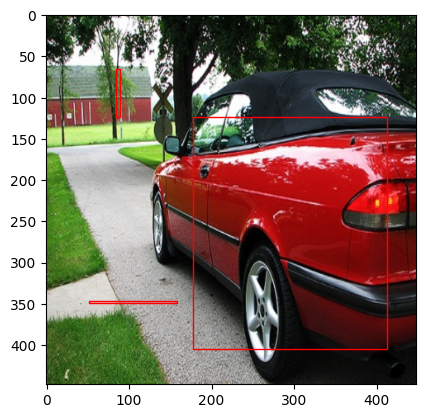

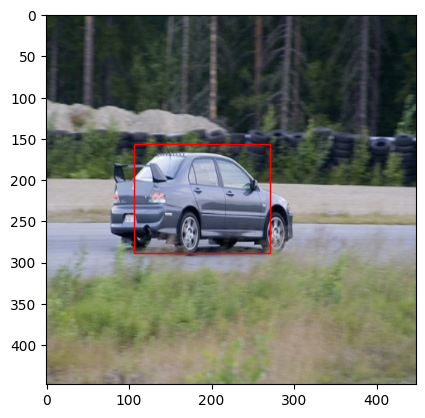

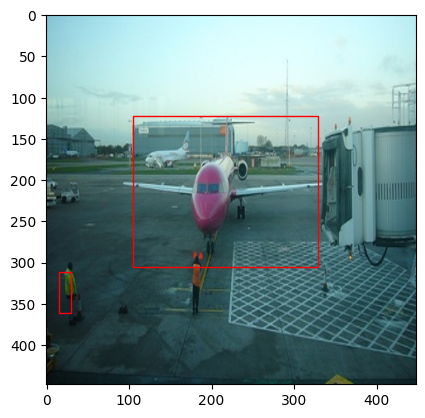

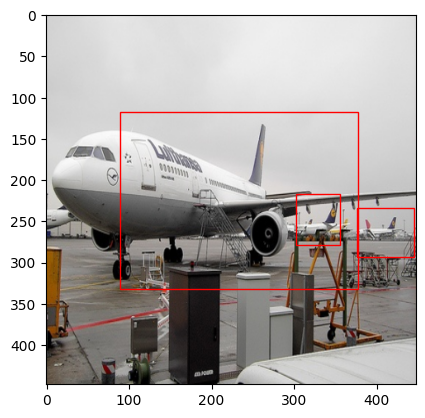

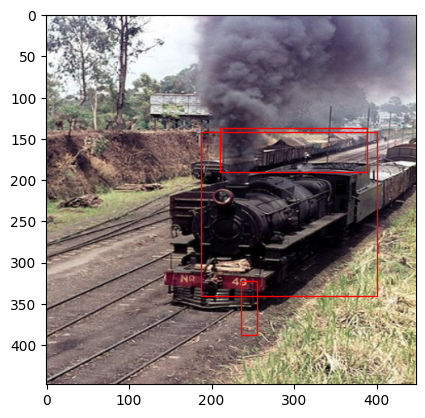

...

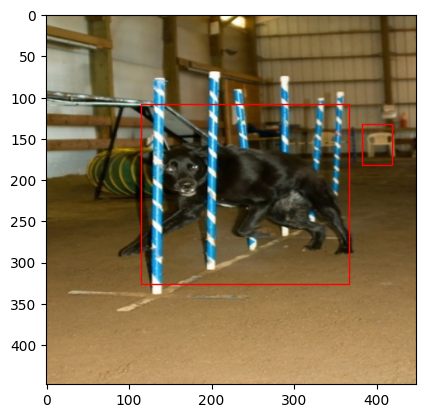

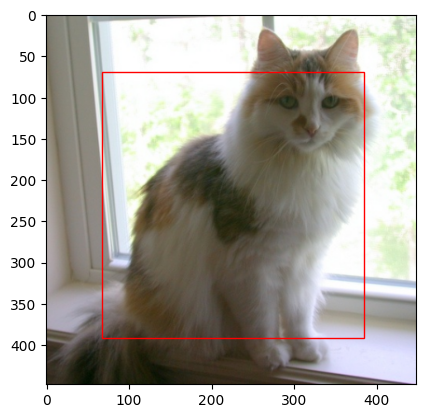

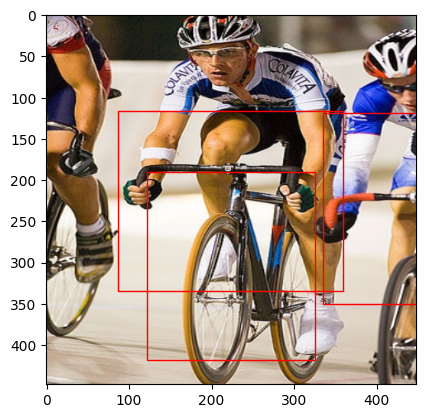

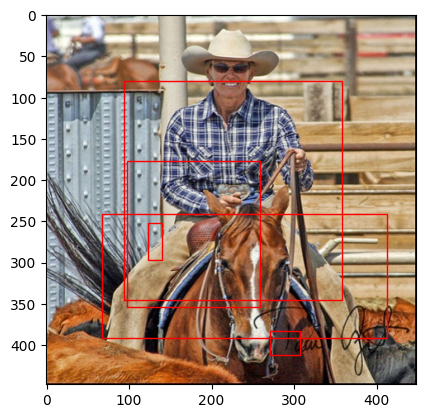

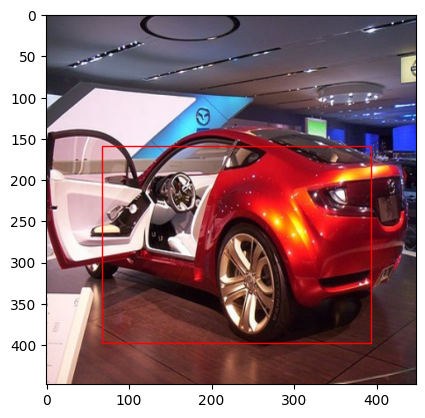

In [7]:
# visualization for the first batch
for x, y in train_loader:
    x = x.to(device)
    bboxes = cellboxes_to_boxes(model(x)) # list of 8 lists of len 49 each, 49 = 7*7 the number of cells
    for idx in range(16):
        bboxes_ = non_max_suppression(bboxes[idx], iou_threshold=0.5, threshold=0.4, box_format="midpoint")
        plot_image(x[idx].permute(1,2,0).to("cpu"), bboxes_) 
    break      


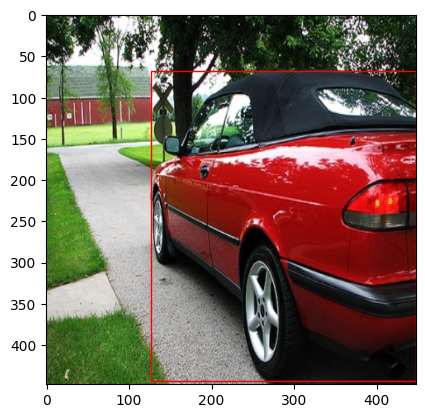

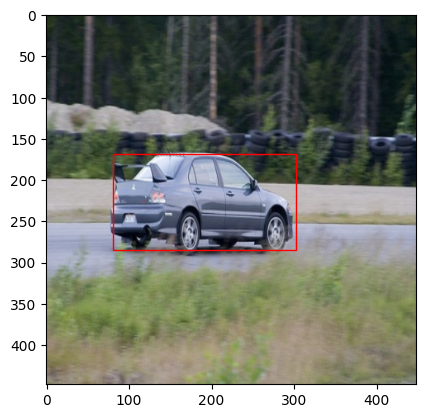

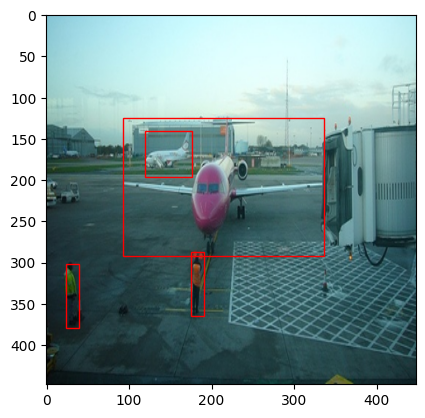

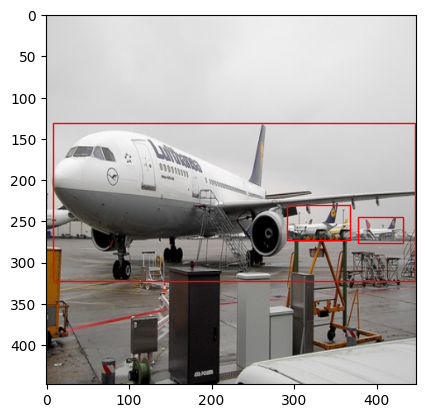

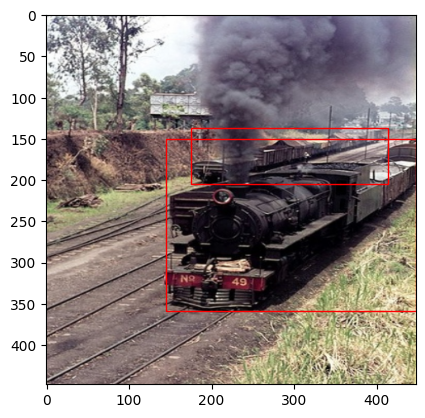

...

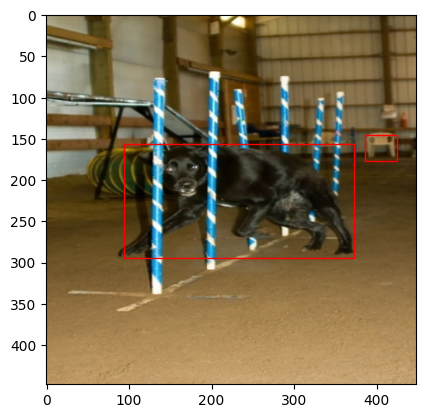

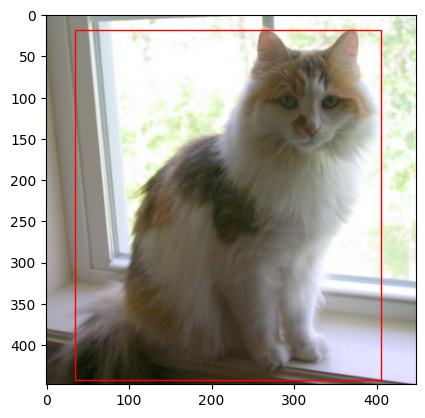

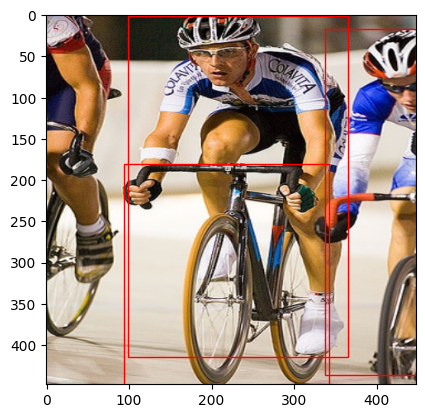

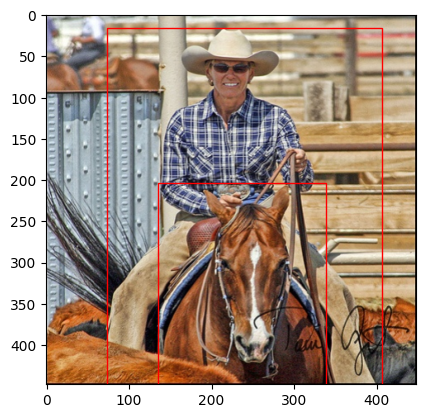

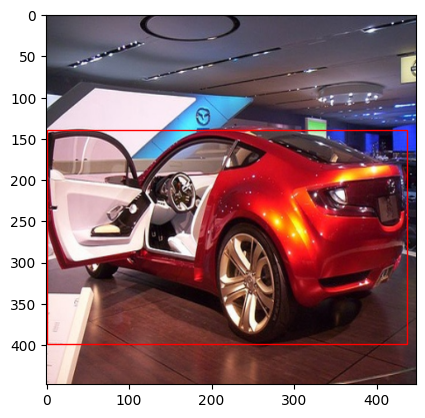

In [8]:
batch_idx = 0
for x, y in train_loader:
    x = x.to(device)
    for idx in range(16):
        true_bboxes_ = non_max_suppression(true_bboxes[batch_idx][idx], iou_threshold=0.5, threshold=0.4, box_format="midpoint")
        plot_image(x[idx].permute(1,2,0).to("cpu"), true_bboxes_)       
    break